# Week 07 - Maps

This notebook is also available on GitHub.

#### Topics
 1. Intro to maps in bqplot (review)
 2. Geopandas
    * Champaign districts & apartments (extra)
    * Public data
 3. Geopandas + contextily
 4. Geopandas + ipywidgets
 
 
Extra:
 * US waterways
 * more with bqplot & geojson data
 * Super quick ipyleaflets

In [98]:
# import our usual things
import pandas as pd
import matplotlib.pyplot as plt
import geopandas 
import ipyleaflet # probably don't need to download for the actual class
import numpy as np
import bqplot
import geodatasets

## 1. Intro to Maps in bqplot

Let's start with a few simple bqplots.

Let's check out a few other projections for world maps.

In [99]:
# shape data/"axis"
shape_data = bqplot.topo_load('map_data/WorldMap.json')

# scales
sc_geo = bqplot.Mercator() # not a great projection! 

# marks
shape_map = bqplot.Map(map_data=shape_data, scales={'projection':sc_geo})

# put it all together in afigure
fig = bqplot.Figure(marks=[shape_map], 
                   fig_margin={'top':0, 'bottom':0, 'left':0, 'right':0})
fig

Figure(fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0}, marks=[Map(hovered_styles={'hovered_fill': '…

But also an issue:

In [100]:
# "axis"/shape data
shape_data = bqplot.topo_load('map_data/WorldMap.json')

# scales
sc_geo = bqplot.Gnomonic() # not a great projection! 

# marks
shape_map = bqplot.Map(map_data=shape_data, scales={'projection':sc_geo})

# put it all together in afigure
fig = bqplot.Figure(marks=[shape_map], 
                   fig_margin={'top':0, 'bottom':0, 'left':0, 'right':0})
fig

Figure(fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0}, marks=[Map(hovered_styles={'hovered_fill': '…

Let's zoom in on where we are: the US

In [101]:
# scales
sc_geo = bqplot.AlbersUSA() # a projection from the globe (sphere) onto a plane (US centric)

# "axis" - in this case its a set of outlines
state_data = bqplot.topo_load('map_data/USStatesMap.json')

# marks
states_map = bqplot.Map(map_data=state_data, scales={'projection':sc_geo})

# put it all together in afigure
fig = bqplot.Figure(marks=[states_map], 
                   fig_margin={'top':0, 'bottom':0, 'left':0, 'right':0})
fig

Figure(fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0}, marks=[Map(hovered_styles={'hovered_fill': '…

`bqplot` is nice because there are features we can display interactively, like info available in tooltips:

In [102]:
# scales
sc_geo = bqplot.AlbersUSA() # a projection from the globe (sphere) onto a plane (US centric)

# "axis" - in this case its a set of outlines
state_data = bqplot.topo_load('map_data/USStatesMap.json')

# hover tooltip
def_tt = bqplot.Tooltip(fields=['id', 'name'])

# marks
states_map = bqplot.Map(map_data=state_data, scales={'projection':sc_geo}, tooltip=def_tt)

# add in interactivity
states_map.interactions = {'click': 'select', 'hover': 'tooltip'}

# put it all together in afigure
fig = bqplot.Figure(marks=[states_map], 
                   fig_margin={'top':0, 'bottom':0, 'left':0, 'right':0})
fig

Figure(fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0}, marks=[Map(hovered_styles={'hovered_fill': '…

Let's check out which maps we have available to us:

In [103]:
!ls /opt/anaconda3/pkgs/bqplot-0.12.30-pyhd8ed1ab_0/site-packages/bqplot/map_data

EuropeMap.json     USCountiesMap.json USStatesMap.json   WorldMap.json


In [104]:
# could also be here:
#!ls ~/opt/anaconda3/pkgs/bqplot-0.12.30-pyhd8ed1ab_0/site-packages/bqplot/map_data

So, there is not a ton of map data in there, and also bqplot makes it hard to create multiple, interactive layers.

How do we access other kinds of maps and map data?  Let's check out a few other things.

## 2. Geopandas

Where can we get data?  There are a few that are "stored" in geopandas:

In [105]:
geodatasets.data

{'geoda': {'airbnb': {'url': 'https://geodacenter.github.io/data-and-lab//data/airbnb.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.airbnb',
   'description': 'Airbnb rentals, socioeconomics, and crime in Chicago',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 21,
   'details': 'https://geodacenter.github.io/data-and-lab//airbnb/',
   'hash': 'a2ab1e3f938226d287dd76cde18c00e2d3a260640dd826da7131827d9e76c824',
   'filename': 'airbnb.zip'},
  'atlanta': {'url': 'https://geodacenter.github.io/data-and-lab//data/atlanta_hom.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.atlanta',
   'description': 'Atlanta, GA region homicide counts and rates',
   'geometry_type': 'Polygon',
   'nrows': 90,
   'ncols': 24,
   'details': 'https://geodacenter.github.io/data-and-lab//atlanta_old/',
   'hash': 'a33a76e12168fe84361e60c88a9df4856730487305846c559715c89b1a2b5e09',
   'filename': 'atlanta_hom.zip',
   'members': ['atlanta_hom/atl_hom.geojson']},
  'cars': {'url': 'https://geodacenter.github.io/data-and-lab//data/Abandoned_Vehicles_Map.csv',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.cars',
   'description': '2011 abandoned vehicles in Chicago (311 complaints).',
   'geometry_type': 'Point',
   'nrows': 137867,
   'ncols': 21,
   'details': 'https://geodacenter.github.io/data-and-lab//1-source-and-description/',
   'hash': '6a0b23bc7eda2dcf1af02d43ccf506b24ca8d8c6dc2fe86a2a1cc051b03aae9e',
   'filename': 'Abandoned_Vehicles_Map.csv'},
  'charleston1': {'url': 'https://geodacenter.github.io/data-and-lab//data/CharlestonMSA.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.charleston1',
   'description': '2000 Census Tract Data for Charleston, SC MSA and counties',
   'geometry_type': 'Polygon',
   'nrows': 117,
   'ncols': 31,
   'details': 'https://geodacenter.github.io/data-and-lab//charleston-1_old/',
   'hash': '4a4fa9c8dd4231ae0b2f12f24895b8336bcab0c28c48653a967cffe011f63a7c',
   'filename': 'CharlestonMSA.zip',
   'members': ['CharlestonMSA/sc_final_census2.gpkg']},
  'charleston2': {'url': 'https://geodacenter.github.io/data-and-lab//data/CharlestonMSA2.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.charleston2',
   'description': '1998 and 2001 Zip Code Business Patterns (Census Bureau) for Charleston, SC MSA',
   'geometry_type': 'Polygon',
   'nrows': 42,
   'ncols': 60,
   'details': 'https://geodacenter.github.io/data-and-lab//charleston2/',
   'hash': '056d5d6e236b5bd95f5aee26c77bbe7d61bd07db5aaf72866c2f545205c1d8d7',
   'filename': 'CharlestonMSA2.zip',
   'members': ['CharlestonMSA2/CharlestonMSA2.gpkg']},
  'chicago_health': {'url': 'https://geodacenter.github.io/data-and-lab//data/comarea.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.chicago_health',
   'description': 'Chicago Health + Socio-Economics',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 87,
   'details': 'https://geodacenter.github.io/data-and-lab//comarea_vars/',
   'hash': '4e872adb552786eae2fcd745524696e5e4cd33cc9a6c032471c0e75328871401',
   'filename': 'comarea.zip'},
  'chicago_commpop': {'url': 'https://geodacenter.github.io/data-and-lab//data/chicago_commpop.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.chicago_commpop',
   'description': 'Chicago Community Area Population Percent Change for 2000 and 2010',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 9,
   'details': 'https://geodacenter.github.io/data-and-lab//commpop/',
   'hash': '1dbebb50c8ea47e2279ea819ef64ba793bdee2b88e4716bd6c6ec0e0d8e0e05b',
   'filename': 'c

Not many, but we plot the NYC boroughs very easy:

In [106]:
geodatasets.get_path('ny bb')

'/Users/jnaiman/Library/Caches/geodatasets/nybb_16a.zip.unzip/nybb_16a/nybb.shp'

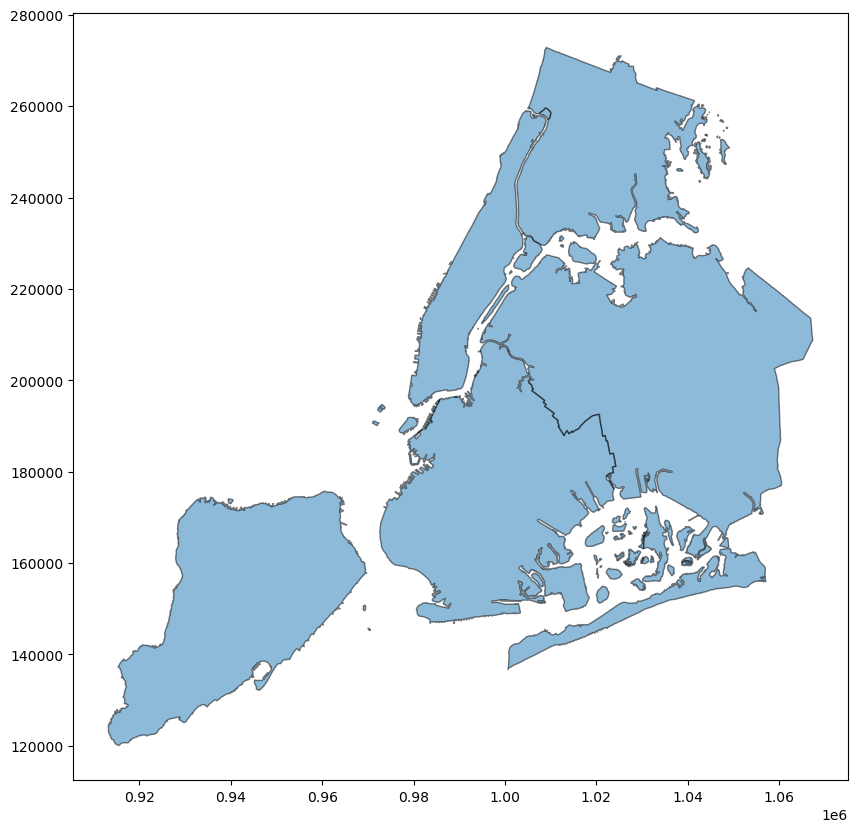

In [107]:
gdf = geopandas.read_file(geodatasets.get_path('ny bb'))
ax = gdf.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')

### 2.1 Champaign City data -- districts & apartments

We live in a pretty cool city, that actually has a lot of openly accessible datasets here:

https://gis-cityofchampaign.opendata.arcgis.com/

Specifically, you can find lots of data here: https://gis-cityofchampaign.opendata.arcgis.com/search?collection=Dataset

We have a really nice interface that we can check out this data easily online.  Let's check out a map of the city council districts: https://gis-cityofchampaign.opendata.arcgis.com/datasets/city-council-districts

There is a nice visualization at the top that actually plots for us a lot of useful things!  Let's see how we can access this dataset and make some plots ourselves, by going to `APIs` $\rightarrow$ `GeoJSON`.

Scroll down to the bottom and click on "I want to use this":

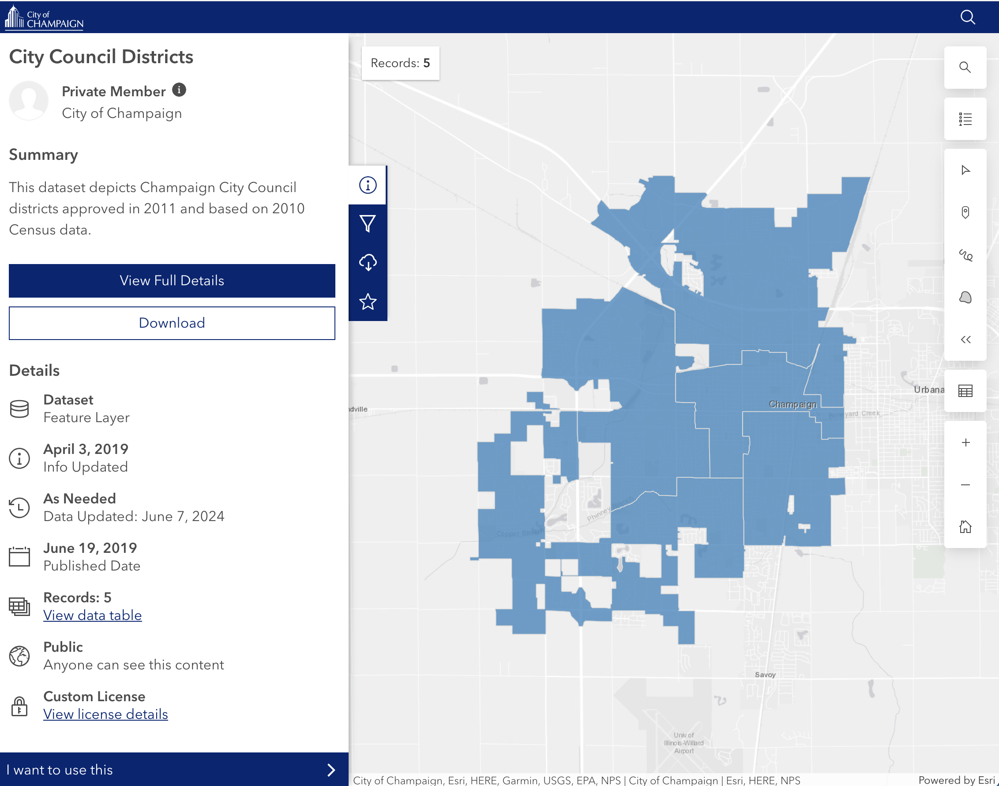

and then click on "View API Resources":

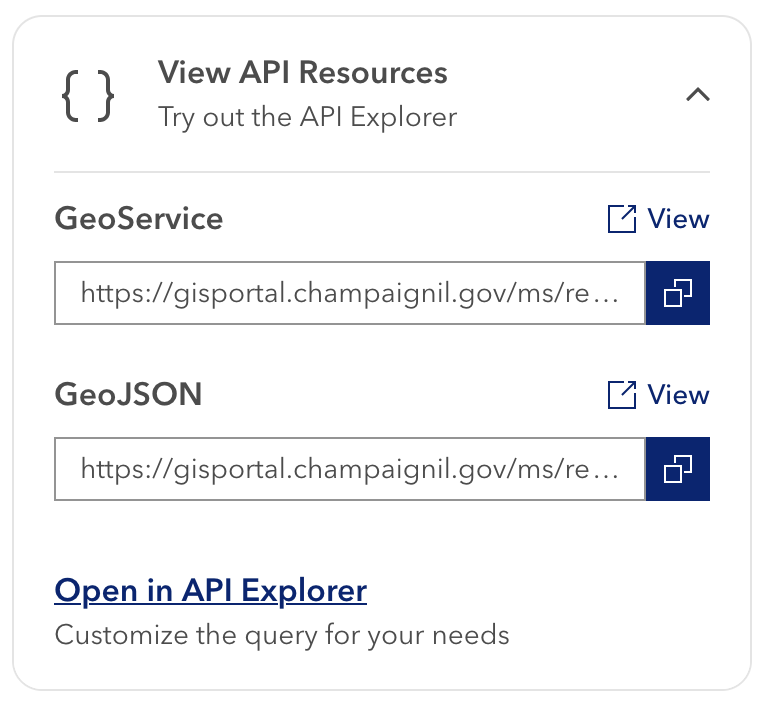

Let's grab: https://gisportal.champaignil.gov/ms/rest/services/Open_Data/Open_Data/MapServer/1/query?outFields=*&where=1%3D1&f=geojson

This is showing the city council districts -- i.e. areas of Champaign that are separated by representation on the city council.

In [108]:
gdf_councils = geopandas.read_file('https://gisportal.champaignil.gov/ms/rest/services/Open_Data/Open_Data/MapServer/1/query?outFields=*&where=1%3D1&f=geojson')

Like with any pandas dataframe, we can take a look at things:

In [109]:
gdf_councils.head()

,OBJECTID_1,District,Council_me,Shape.STArea(),Shape.STLength(),geometry
0,1219,1,Davion Williams,1.991748e+08,133825.673297,"POLYGON ((-88.27716 40.16364, -88.27732 40.163..."
1,1220,3,Shauna Clayborn,1.382327e+08,73289.747391,"POLYGON ((-88.28312 40.13667, -88.28372 40.136..."
2,1221,2,Bob Pollett,7.472444e+07,50905.604100,"POLYGON ((-88.2468 40.11261, -88.24763 40.1126..."
3,1222,5,Vanna Pianfetti,1.776407e+08,204013.082479,"POLYGON ((-88.31441 40.11698, -88.31441 40.116..."
4,1223,4,Michael Foellmer,6.308923e+07,58697.438268,"POLYGON ((-88.22877 40.11638, -88.22884 40.116..."


In this case, `describe` probably won't help us, but we do have this available to us:

In [110]:
gdf_councils.describe()

,OBJECTID_1,Shape.STArea(),Shape.STLength()
count,5.000000,5.000000e+00,5.000000
mean,1221.000000,1.305724e+08,104146.309107
std,1.581139,6.052553e+07,64626.884912
min,1219.000000,6.308923e+07,50905.604100
25%,1220.000000,7.472444e+07,58697.438268
50%,1221.000000,1.382327e+08,73289.747391
75%,1222.000000,1.776407e+08,133825.673297
max,1223.000000,1.991748e+08,204013.082479


We can also make quick plots:

<Axes: >

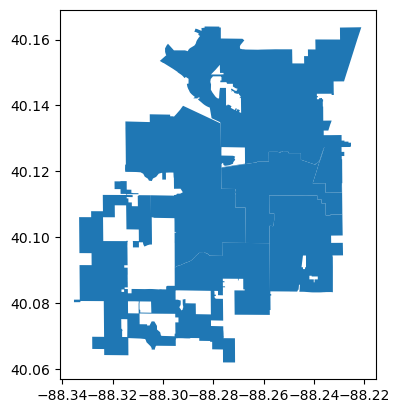

In [111]:
gdf_councils.plot()

We can make fancier plots with matplotlib:

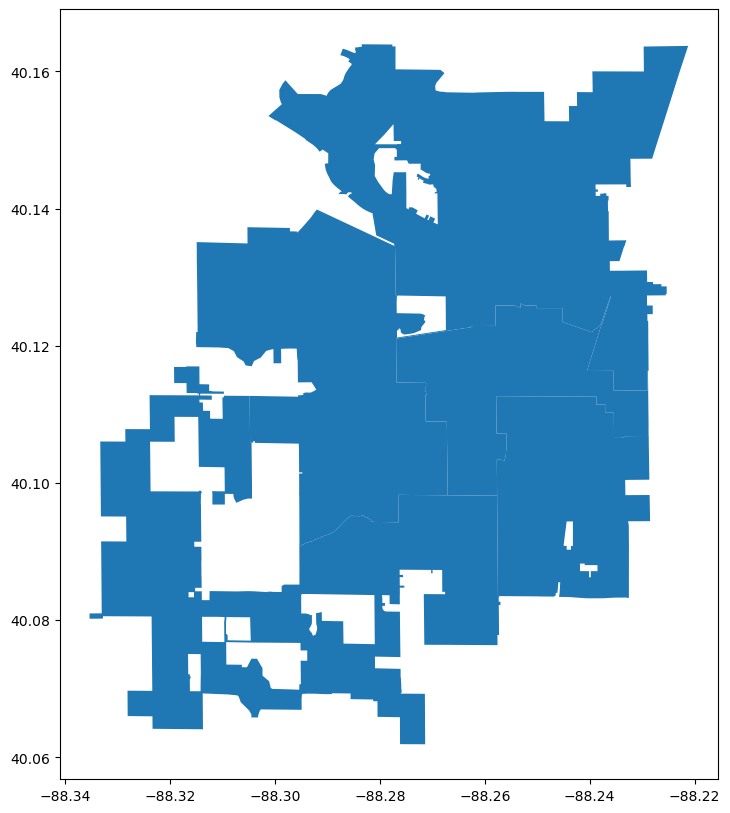

In [112]:
fig, ax = plt.subplots(figsize=(10,10))

gdf_councils.plot(ax=ax)

plt.show()

There are also a few geo-specific functions in there.  For example, we can plot out boundaries of regions:

<Axes: >

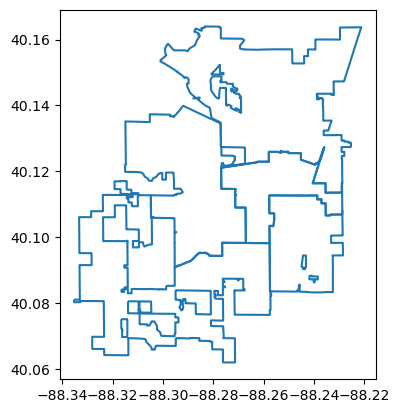

In [113]:
gdf_councils.boundary.plot()

We can get the bounding boxes for each council district:

In [114]:
gdf_councils.bounds

,minx,miny,maxx,maxy
0,-88.301247,40.113461,-88.221225,40.163956
1,-88.315071,40.090758,-88.267072,40.139863
2,-88.257818,40.083182,-88.228485,40.112653
3,-88.335351,40.061898,-88.257012,40.116995
4,-88.276904,40.098142,-88.228768,40.127264


We can also find the centers of each of each specific shape:

In [115]:
gdf_councils.centroid # ignoring .to_crs() error for now

/var/folders/1c/xcwp8_px05xg1_3xd9nn9qhm0000gn/T/ipykernel_27882/1666737993.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_councils.centroid # ignoring .to_crs() error for now


0    POINT (-88.25684 40.14254)
1    POINT (-88.29004 40.11719)
2    POINT (-88.24455 40.09783)
3    POINT (-88.29863 40.08609)
4    POINT (-88.25577 40.11441)
dtype: geometry

You might get a warning about a CRS, i.e. a *coordinate reference system*.

There is also information about the coordinate reference system:

In [116]:
gdf_councils.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

This is a specific projection & coordinate system:

https://spatialreference.org/ref/epsg/wgs-84/

https://epsg.io/4326

We can use geopandas to overplot data as well.  Let's also overlay the properties that the city owns: https://gis-cityofchampaign.opendata.arcgis.com/datasets/city-owned-properties

In [117]:
gdf_props = geopandas.read_file('https://gisportal.champaignil.gov/ms/rest/services/Open_Data/Open_Data/MapServer/2/query?outFields=*&where=1%3D1&f=geojson')

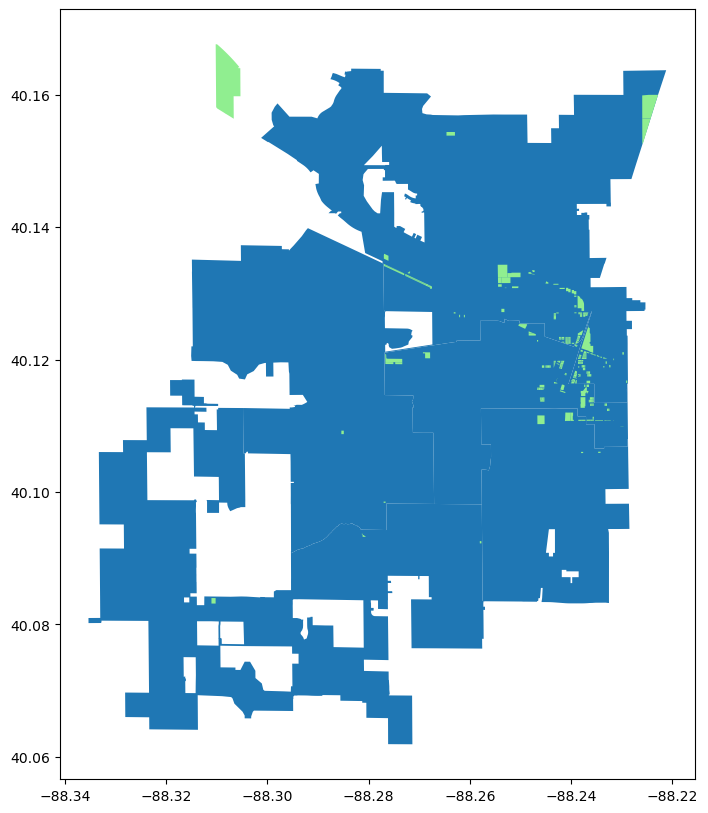

In [118]:
fig, ax = plt.subplots(figsize=(10,10))

gdf_councils.plot(ax=ax)

gdf_props.plot(ax=ax, color='lightgreen')

plt.show()

We can move to our area (if we were on campus):

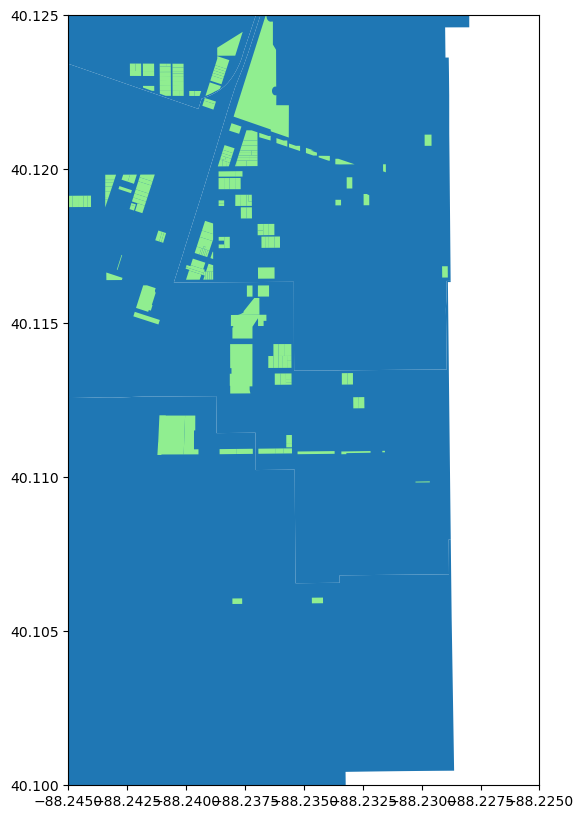

In [119]:
fig, ax = plt.subplots(figsize=(10,10))

gdf_councils.plot(ax=ax)

gdf_props.plot(ax=ax, color='lightgreen')

ax.set_xlim(-88.245, -88.225)
ax.set_ylim(40.10, 40.125)

plt.show()

### Extra: apartments & building types too -- skip, we do this below in a different way

This will do a bit of data manipulation to be able to plot apartments with different color schemes.

In [120]:
#gdf_apts = geopandas.read_file('https://opendata.arcgis.com/datasets/64154052c5a040e287bae1583d727825_8.geojson')
gdf_apts = geopandas.read_file('https://gisportal.champaignil.gov/ms/rest/services/Open_Data/Open_Data/MapServer/8/query?outFields=*&where=1%3D1&f=geojson')

Quick look:

<Axes: >

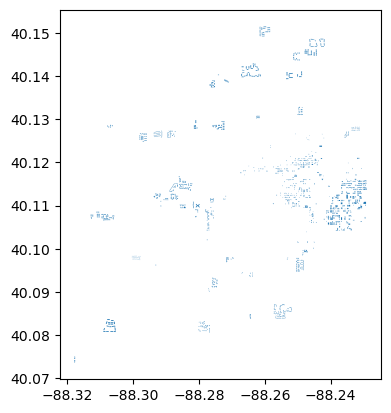

In [121]:
gdf_apts.plot()

What can we color by?

In [122]:
gdf_apts.head()

,OBJECTID,Address,Parcel,Units,Stories,UniqueID,Building_Name,Complex_Name,Case_Number,Building_Type,...,Last_Date,Comments,Safety_Comments,Fire_Alarms,Sprinkler,Managing_Company,MFRecyclingStatus,Shape.STArea(),Shape.STLength(),geometry
0,1,2009 Moreland Blvd,412001126038,36,3,0.0,2009 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,19657.996933,929.167804,"POLYGON ((-88.25315 40.14017, -88.25315 40.140..."
1,2,2011 Moreland Blvd,412001126038,36,3,1.0,2011 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,19735.512411,950.194217,"POLYGON ((-88.2526 40.14057, -88.25256 40.1405..."
2,3,2007 Moreland Blvd,412001126038,24,3,2.0,2007 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,13970.179208,678.398035,"POLYGON ((-88.25274 40.14045, -88.25274 40.140..."
3,4,2003 Moreland Blvd,412001126038,36,3,3.0,2003 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,19739.423285,941.358477,"POLYGON ((-88.25154 40.13978, -88.25156 40.139..."
4,5,2005 Moreland Blvd,412001126038,24,3,4.0,2005 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,13065.121447,636.744457,"POLYGON ((-88.25351 40.13934, -88.25348 40.139..."


How about by the number of Stories (floors)?

In [123]:
gdf_apts['Stories'].unique()

array(['3', '3 ', '2', '1', '5', ' 1', ' 3', '6', ' 6', '4 ', '4', '20',
       ' 4', '24', '7', ' ', '8'], dtype=object)

Let's clean out the None's and give them a value of 0:

In [124]:
#gdf_apts['Stories'][gdf_apts['Stories'].isnull()] = '0' # ignorning warnings
# or, doing it a more pandas way:
gdf_apts.loc[gdf_apts['Stories'].isnull(), 'Stories'] = '0'

In [125]:
gdf_apts['Stories'].unique()

array(['3', '3 ', '2', '1', '5', ' 1', ' 3', '6', ' 6', '4 ', '4', '20',
       ' 4', '24', '7', ' ', '8'], dtype=object)

It looks like we also have some "empties" - let's change those to zeros as well:

In [126]:
#gdf_apts['Stories'][gdf_apts['Stories']==' '] = '0'
gdf_apts.loc[gdf_apts['Stories']==' ', 'Stories'] = '0'

In [127]:
gdf_apts['Stories'].unique()

array(['3', '3 ', '2', '1', '5', ' 1', ' 3', '6', ' 6', '4 ', '4', '20',
       ' 4', '24', '7', '0', '8'], dtype=object)

We also have some repeated "4"'s but this will be fine once we turn them into integers.  Finally, let's turn these floors into numbers:

In [128]:
gdf_apts['Stories'] = pd.to_numeric(gdf_apts['Stories'], errors='coerce')

In [129]:
gdf_apts['Stories'].unique()

array([ 3,  2,  1,  5,  6,  4, 20, 24,  7,  0,  8])

Looks good!  We can make a quick histogram to see what floors looks like:

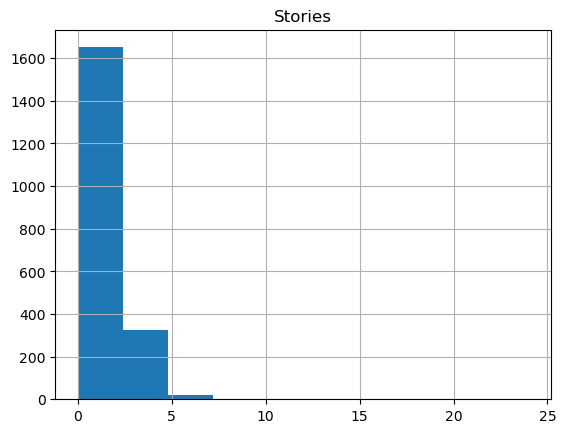

In [130]:
gdf_apts.hist(column='Stories')
plt.show()

Also, let's plot!

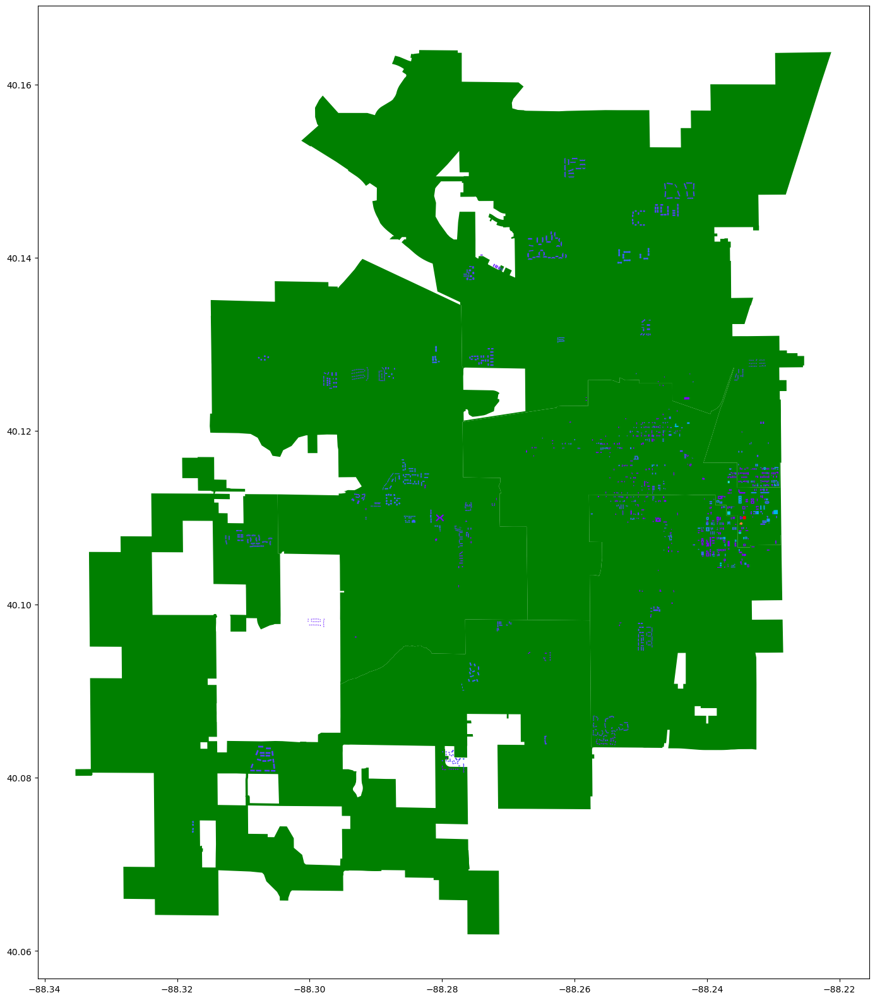

In [131]:
fig, ax = plt.subplots(figsize=(20,20))
gdf_councils.plot(ax=ax, color="green")
gdf_apts.plot(column='Stories', ax=ax, cmap='rainbow')

#ax.set_xlim(-88.35, -88.2)
#ax.set_ylim(40, 40.2)
plt.show()

Zoomed in:

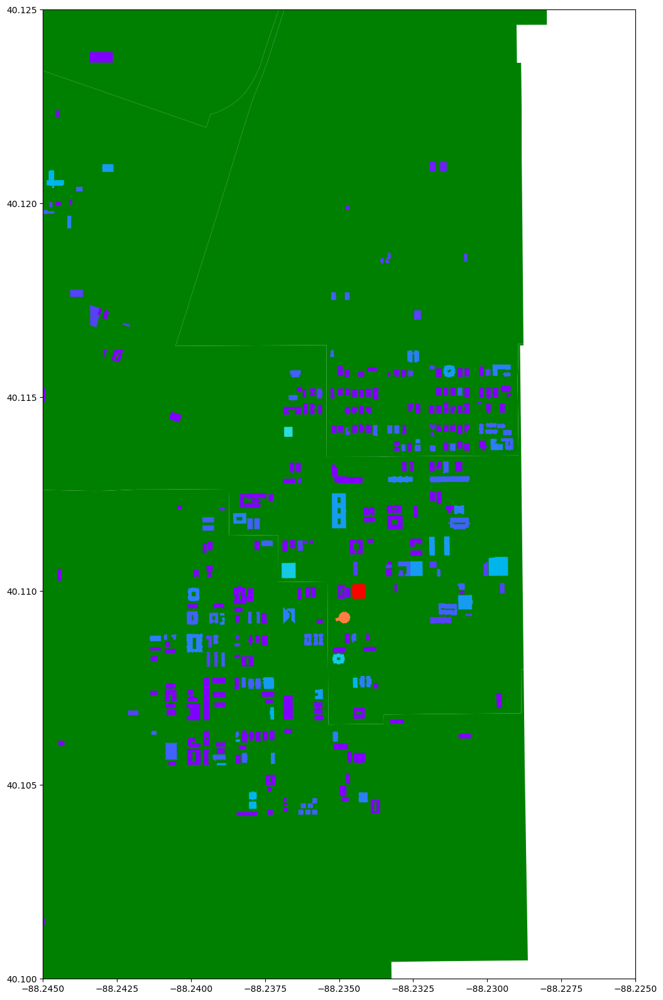

In [132]:
fig, ax = plt.subplots(figsize=(20,20))
gdf_councils.plot(ax=ax, color="green")
gdf_apts.plot(column='Stories', ax=ax, cmap='rainbow')

ax.set_xlim(-88.245, -88.225)
ax.set_ylim(40.10, 40.125)

plt.show()

In [133]:
gdf_apts['Building_Type'].unique()

array(['Complex', 'Building', 'House', 'Over Commercial'], dtype=object)

We have a `None` -- Got to clean again:

In [134]:
#gdf_apts['Building_Type'][gdf_apts['Building_Type'].isnull()] = 'Not specified'
gdf_apts.loc[gdf_apts['Building_Type'].isnull(), 'Building_Type'] = 'Not specified' # pandas friendly

In [135]:
gdf_apts['Building_Type'].unique()

array(['Complex', 'Building', 'House', 'Over Commercial'], dtype=object)

Let's plot with a legend!  

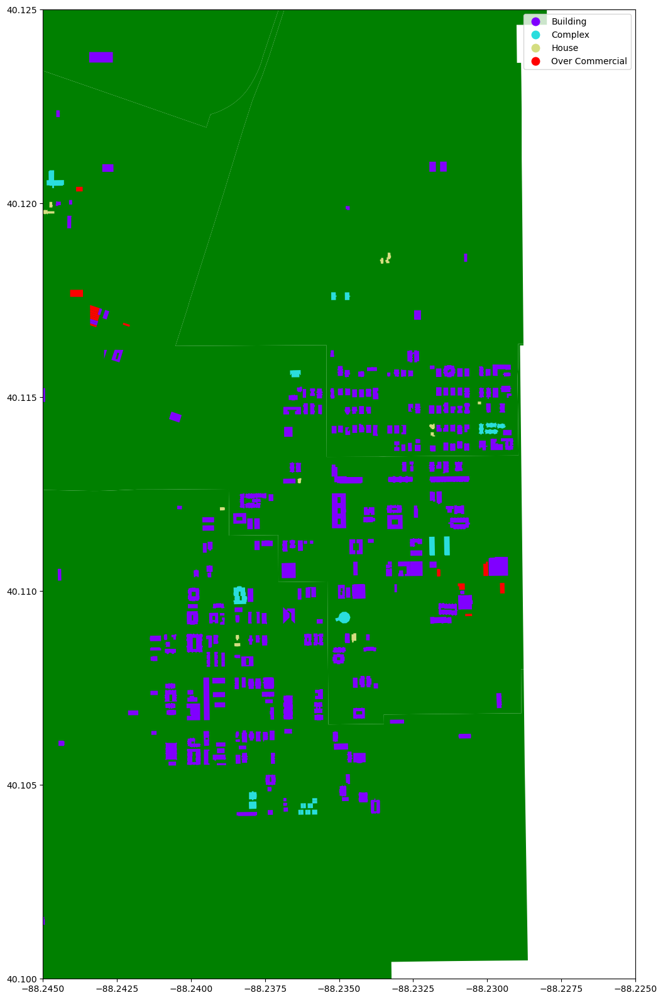

In [136]:
fig, ax = plt.subplots(figsize=(20,20))
gdf_councils.plot(ax=ax, color="green")
gdf_apts.plot(column='Building_Type', ax=ax, cmap='rainbow', categorical=True, legend=True)

ax.set_xlim(-88.245, -88.225)
ax.set_ylim(40.10, 40.125)
plt.show()

### END EXTRA SKIP

### 2.2 Public data with geopandas

**NOTE:** some of this won't work during a federal government shutdown

Is a bit hard to find, but you can, with a good bit of looking around, find it: https://datagateway.nrcs.usda.gov/

Which can lead you to places like: https://www.census.gov/geographies/mapping-files/time-series/geo/tiger-line-file.html, where you can then navigate to their FTP archive.

Let's grab the state boundaries:

In [137]:
#gdf_states = geopandas.read_file('https://www2.census.gov/geo/tiger/TIGER2019/STATE/tl_2019_us_state.zip')
gdf_states = geopandas.read_file('https://www2.census.gov/geo/tiger/TIGER2020/STATE/tl_2020_us_state.zip')

<Axes: >

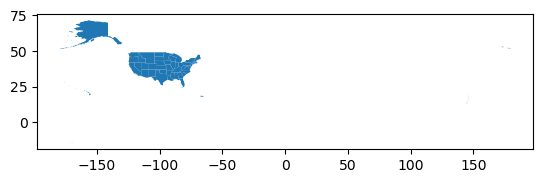

In [138]:
gdf_states.plot()

Let's zoom in to the US and take a look:

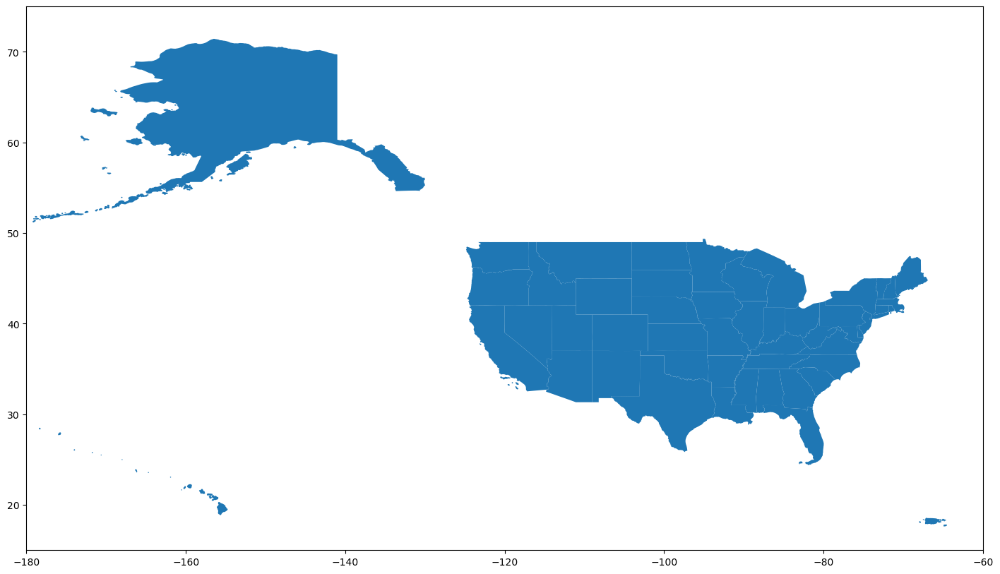

In [139]:
fig, ax = plt.subplots(figsize=(20,10))

gdf_states.plot(ax=ax)

ax.set_xlim(-180,-60)
ax.set_ylim(15, 75)

plt.show()

What other information can we grab?  More digging can lead to:

Which can lead you to: https://www.census.gov/cgi-bin/geo/shapefiles/index.php?year=2019&layergroup=American+Indian+Area+Geography

You can download the file:

In [140]:
#gdf_na = geopandas.read_file('/Users/jnaiman/Downloads/tl_2020_us_aiannh/tl_2020_us_aiannh.shp')

Or we can ping directly as we did before.

In [141]:
#gdf_na = geopandas.read_file('https://www2.census.gov/geo/tiger/TIGER2020/AIANNH/tl_2020_us_aiannh.zip')
gdf_na = geopandas.read_file('https://www2.census.gov/geo/tiger/TIGER2024/AIANNH/tl_2024_us_aiannh.zip') # won't work during fed gov shutdown

In [142]:
gdf_na.head()

,AIANNHCE,AIANNHNS,GEOID,GEOIDFQ,NAME,NAMELSAD,LSAD,CLASSFP,COMPTYP,AIANNHR,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,2320,02419022,2320R,2520000US2320R,Mohegan,Mohegan Reservation,86,D2,R,F,G2101,A,2457041,123,+41.4858024,-072.0902766,"MULTIPOLYGON (((-72.08306 41.49763, -72.08284 ..."
1,9100,01930930,9100R,2520000US9100R,Golden Hill Paugussett,Golden Hill Paugussett (state) Reservation,86,D4,R,S,G2101,A,399343,0,+41.5521875,-072.2680204,"MULTIPOLYGON (((-72.26917 41.55472, -72.26774 ..."
2,4110,02419484,4110R,2520000US4110R,Table Mountain,Table Mountain Rancheria,85,D8,R,F,G2101,A,371387,0,+36.9850490,-119.6396814,"POLYGON ((-119.64082 36.985, -119.64058 36.986..."
3,1380,01666180,1380R,2520000US1380R,Greenville,Greenville Rancheria,85,D2,R,F,G2101,A,284692,0,+40.1487839,-120.8933989,"POLYGON ((-120.89736 40.151, -120.89733 40.151..."
4,1110,00806894,1110R,2520000US1110R,Flathead,Flathead Reservation,86,D2,R,F,G2101,A,5013467061,316267874,+47.4967703,-114.2842791,"POLYGON ((-114.85121 47.88721, -114.81989 47.8..."


We can see where Native American land's are on the US states map:

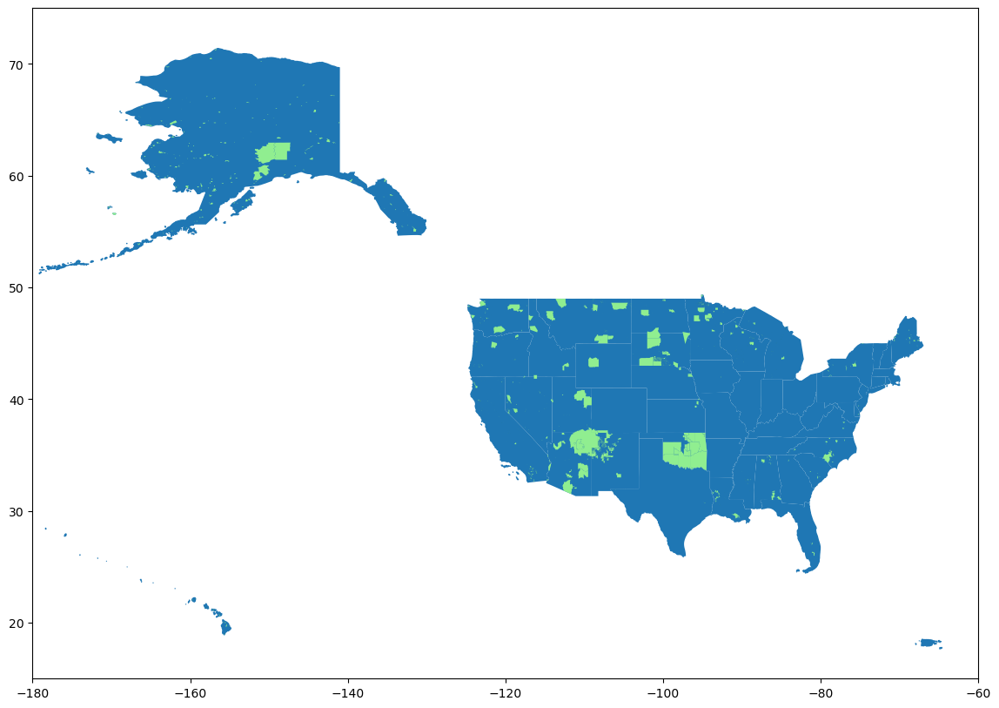

In [143]:
fig, ax = plt.subplots(figsize=(20,10))

gdf_states.plot(ax=ax)
gdf_na.plot(ax=ax, color='lightgreen')

ax.set_xlim(-180,-60)
ax.set_ylim(15, 75)

plt.show()

By type:

In [144]:
gdf_na['NAMELSAD'].unique()

array(['Mohegan Reservation',
       'Golden Hill Paugussett (state) Reservation',
       'Table Mountain Rancheria', 'Greenville Rancheria',
       'Flathead Reservation', 'Bishop Reservation',
       'Fallon Paiute-Shoshone Reservation', 'Walker River Reservation',
       'Los Coyotes Reservation', 'Manzanita Reservation',
       'Mesa Grande Reservation', 'Pala Reservation',
       'Isabella Reservation', 'Mattaponi (state) Reservation',
       'Roaring Creek Rancheria', 'Pueblo of Pojoaque',
       'Rosebud Indian Reservation', 'Woodfords Community',
       'Spokane Reservation', 'Chitimacha Reservation',
       'Coos, Lower Umpqua, and Siuslaw Reservation',
       'Pascua Pueblo Yaqui Reservation', 'Berry Creek Rancheria',
       'Enterprise Rancheria', 'Shakopee Mdewakanton Sioux Community',
       'Santa Rosa Rancheria', "L'Anse Reservation",
       'Paucatuck Eastern Pequot (state) Reservation',
       'Mississippi Choctaw Reservation', 'Duck Valley Reservation',
       'Southe

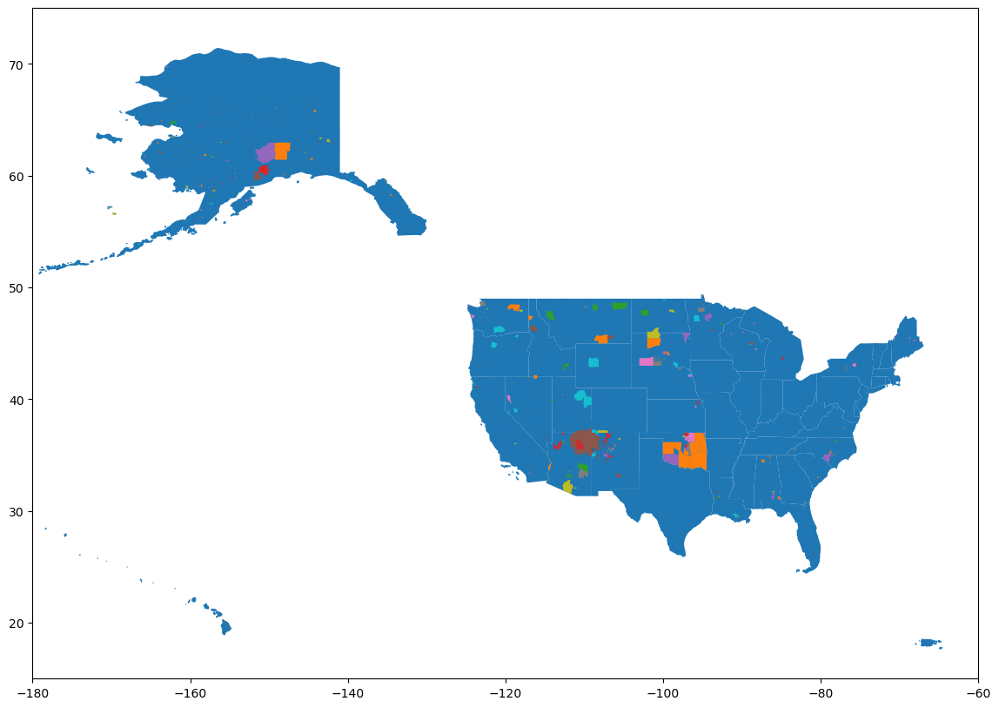

In [145]:
fig, ax = plt.subplots(figsize=(20,10))

gdf_states.plot(ax=ax)
gdf_na.plot(column='NAMELSAD', ax=ax)

ax.set_xlim(-180,-60)
ax.set_ylim(15, 75)

plt.show()

## 3. Geopandas + contextily

Let's go back to our plot of the bouroughs:

In [146]:
#gdf = geopandas.read_file(geopandas.datasets.get_path('nybb')) # old
gdf = geopandas.read_file(geodatasets.get_path('ny bb'))
gdf

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


<Axes: >

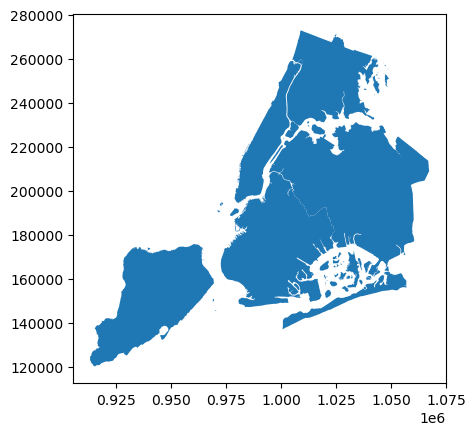

In [147]:
gdf.plot()

Since this is map data, we might expect it to be in lat/long but it is not.  This has to do with the CRS or coordinate-reference-system being used to show this data.  This is sort of like the projection we saw in the lecture.  We can print out what our current CRS is:

In [148]:
gdf.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

So, this might not be super useful right now, but this is just the designation of one sort of coordinate reference system.  We can transform to a lat/long representation with:

In [149]:
gdf = gdf.to_crs(epsg=4326)

<Axes: >

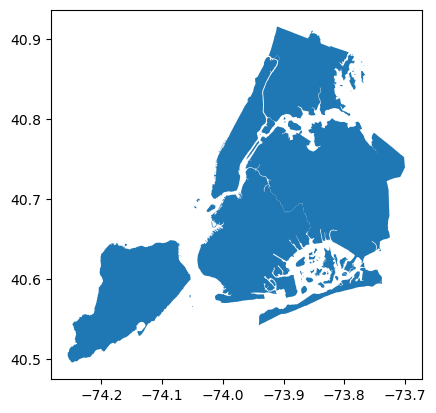

In [150]:
gdf.plot()

Let's put this map into context with a larger map of the area using `contextily` and following the [geopandas docs for adding a basemap](https://geopandas.org/gallery/plotting_basemap_background.html).

First we need to import `contextily` to use it:

In [151]:
import contextily as ctx

The default mapping coordinates for `contextily` are [Web Mercator](https://en.wikipedia.org/wiki/Web_Mercator) so we will need to transform our geometric dataset into the Web Mercator projection:

In [152]:
gdf = gdf.to_crs(epsg=3857)

Let's first plot our NYC data on our own axis:

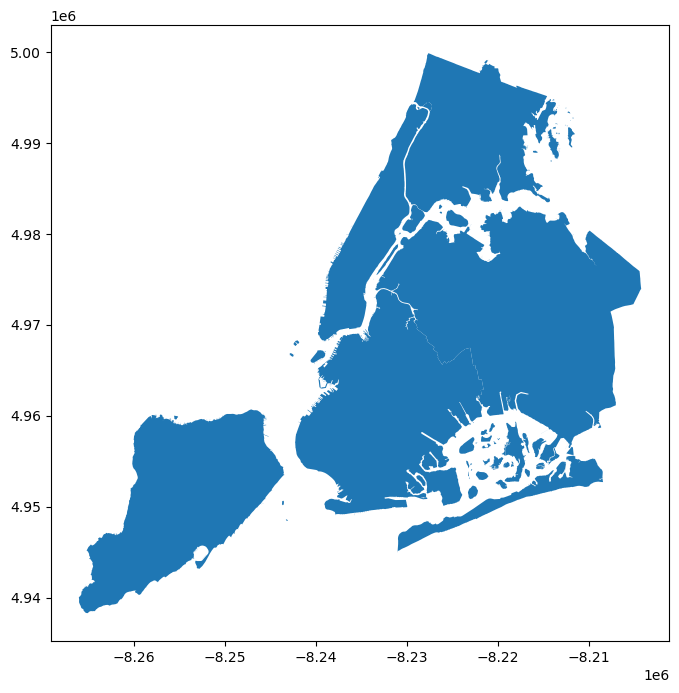

In [153]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

gdf.plot(ax=ax)

plt.show()

So we can see already that the units on the x/y axis are very different!  And even the shapes are a little different than the plots we made above.  Let's re-call this but add a basemap using `contextily`:

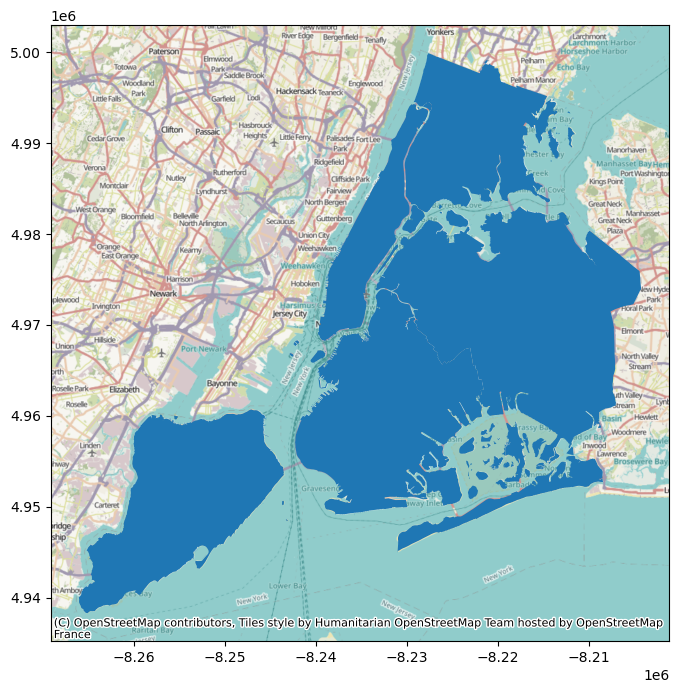

In [154]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

gdf.plot(ax=ax)
ctx.add_basemap(ax=ax)

plt.show()

Hey cool!  We can now see our NYC map on top of a larger map of the NYC area.  Let's make our plot a little see-through so we can see the basemap underneath:

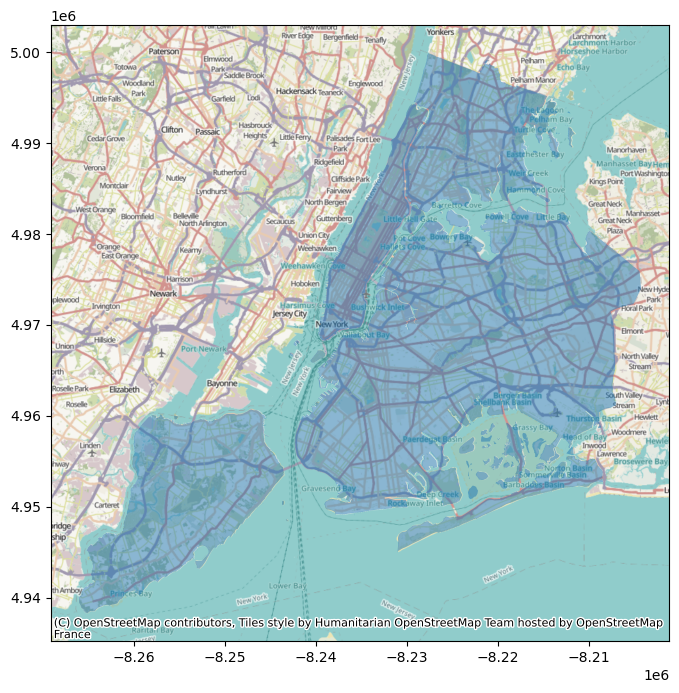

In [155]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

gdf.plot(ax=ax, alpha=0.5)
ctx.add_basemap(ax=ax)

plt.show()

Almost there -- let's also add in a black outline for our borows:

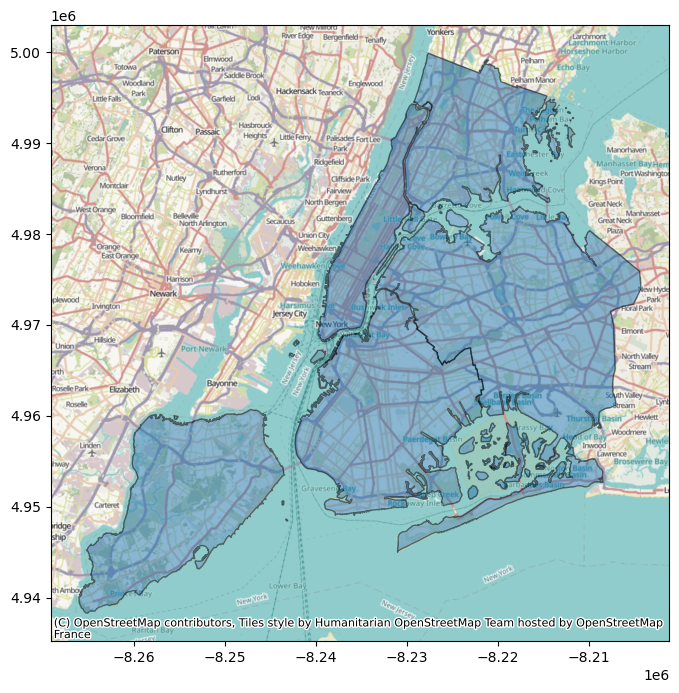

In [156]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

gdf.plot(ax=ax, alpha=0.5, edgecolor='k')
ctx.add_basemap(ax=ax)

plt.show()

Let's try this with our other `geopandas` layers that we were using before for Champaign:

In [157]:
gdf_councils = geopandas.read_file('https://gisportal.champaignil.gov/ms/rest/services/Open_Data/Open_Data/MapServer/1/query?outFields=*&where=1%3D1&f=geojson')
# just in case we over-wrote it or something

In [158]:
gdf_councils.head()

,OBJECTID_1,District,Council_me,Shape.STArea(),Shape.STLength(),geometry
0,1219,1,Davion Williams,1.991748e+08,133825.673297,"POLYGON ((-88.27716 40.16364, -88.27732 40.163..."
1,1220,3,Shauna Clayborn,1.382327e+08,73289.747391,"POLYGON ((-88.28312 40.13667, -88.28372 40.136..."
2,1221,2,Bob Pollett,7.472444e+07,50905.604100,"POLYGON ((-88.2468 40.11261, -88.24763 40.1126..."
3,1222,5,Vanna Pianfetti,1.776407e+08,204013.082479,"POLYGON ((-88.31441 40.11698, -88.31441 40.116..."
4,1223,4,Michael Foellmer,6.308923e+07,58697.438268,"POLYGON ((-88.22877 40.11638, -88.22884 40.116..."


<Axes: >

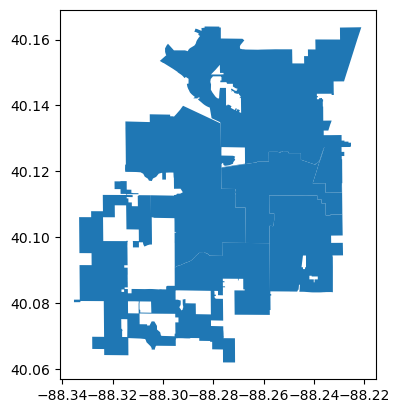

In [159]:
gdf_councils.plot()

First, we transform coordinates into web-mercator:

In [160]:
gdf_councils.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [161]:
gdf_councils = gdf_councils.to_crs(epsg=3857)

Plot!

In [162]:
import contextily as ctx

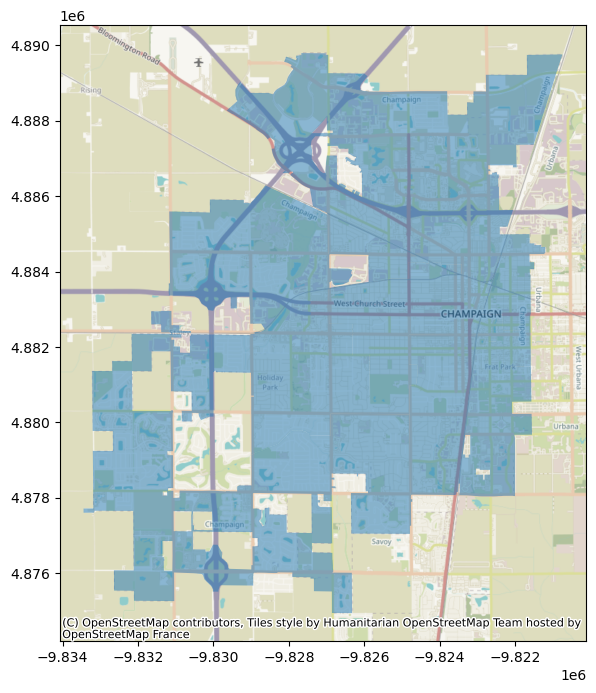

In [163]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

gdf_councils.plot(ax=ax, alpha=0.5)

ctx.add_basemap(ax=ax)

plt.show()

Neat!  Its sort of hard to see the outlines, so we can also do:

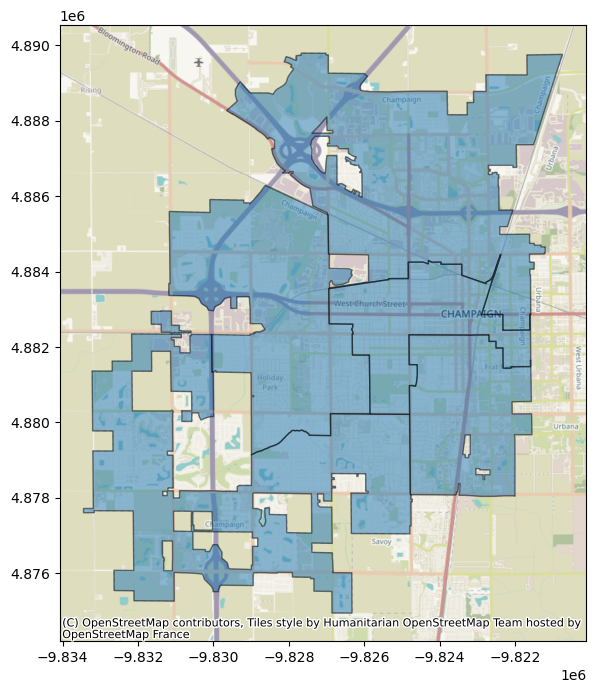

In [164]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
ctx.add_basemap(ax=ax)

plt.show()

Ok, but its a little confusing with this web-mercator stuff.  We can actually specify the coordinate system of our geopandas dataframe in our call to contextily:

In [165]:
gdf_councils = geopandas.read_file('https://opendata.arcgis.com/datasets/1f75636917604299861fb408bbf79378_1.geojson')
# re-read

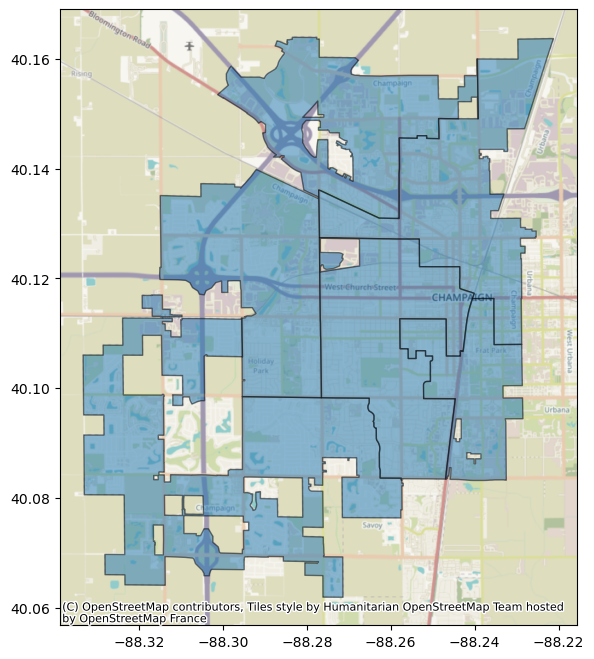

In [166]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
ctx.add_basemap(ax=ax, crs=gdf_councils.crs)
# here, you might get an error and can try:
#ctx.add_basemap(ax=ax, crs=gdf_councils.crs.to_string())

plt.show()

Let's add on some more layers to this map -- let's grab the apartments dataset from the champaign webpage:

In [167]:
#gdf_apts = geopandas.read_file('https://opendata.arcgis.com/datasets/64154052c5a040e287bae1583d727825_8.geojson')

In [168]:
gdf_apts.head()

,OBJECTID,Address,Parcel,Units,Stories,UniqueID,Building_Name,Complex_Name,Case_Number,Building_Type,...,Last_Date,Comments,Safety_Comments,Fire_Alarms,Sprinkler,Managing_Company,MFRecyclingStatus,Shape.STArea(),Shape.STLength(),geometry
0,1,2009 Moreland Blvd,412001126038,36,3,0.0,2009 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,19657.996933,929.167804,"POLYGON ((-88.25315 40.14017, -88.25315 40.140..."
1,2,2011 Moreland Blvd,412001126038,36,3,1.0,2011 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,19735.512411,950.194217,"POLYGON ((-88.2526 40.14057, -88.25256 40.1405..."
2,3,2007 Moreland Blvd,412001126038,24,3,2.0,2007 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,13970.179208,678.398035,"POLYGON ((-88.25274 40.14045, -88.25274 40.140..."
3,4,2003 Moreland Blvd,412001126038,36,3,3.0,2003 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,19739.423285,941.358477,"POLYGON ((-88.25154 40.13978, -88.25156 40.139..."
4,5,2005 Moreland Blvd,412001126038,24,3,4.0,2005 Moreland Blvd,University Village at Champaign,AI07-0147,Complex,...,1.193634e+12,,,Yes,Yes,None,Yes,13065.121447,636.744457,"POLYGON ((-88.25351 40.13934, -88.25348 40.139..."


What kinds of building types do we have?

In [169]:
gdf_apts['Building_Type'].unique()

array(['Complex', 'Building', 'House', 'Over Commercial'], dtype=object)

Oop, looks like there is a "None" object here.  Let's do a bit of data cleaning by *masking* out these `None` values and setting them to "Not Specified"

In [170]:
gdf_apts.loc[gdf_apts['Building_Type'].isnull(), 'Building_Type'] = 'Not specified'

In [171]:
gdf_apts['Building_Type'].unique()

array(['Complex', 'Building', 'House', 'Over Commercial'], dtype=object)

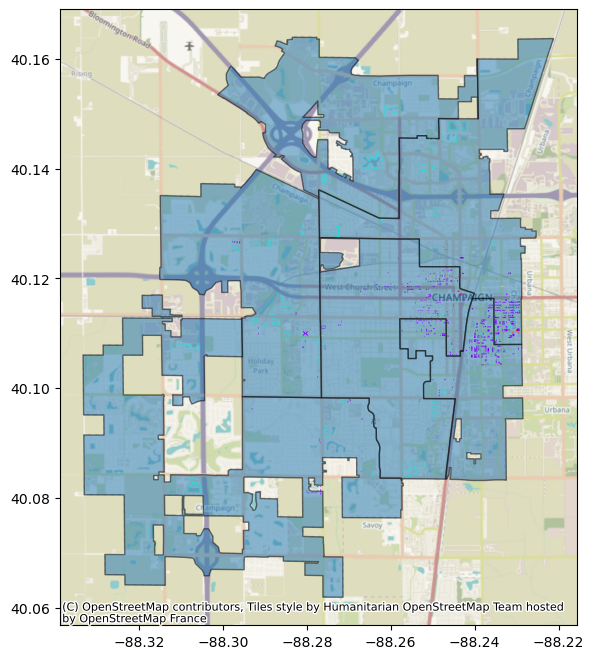

In [172]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
gdf_apts.plot(column='Building_Type', ax=ax, cmap='rainbow')

ctx.add_basemap(ax=ax, crs=gdf_councils.crs.to_string())

plt.show()

Let's zoom into campus town (where we would all be now!)

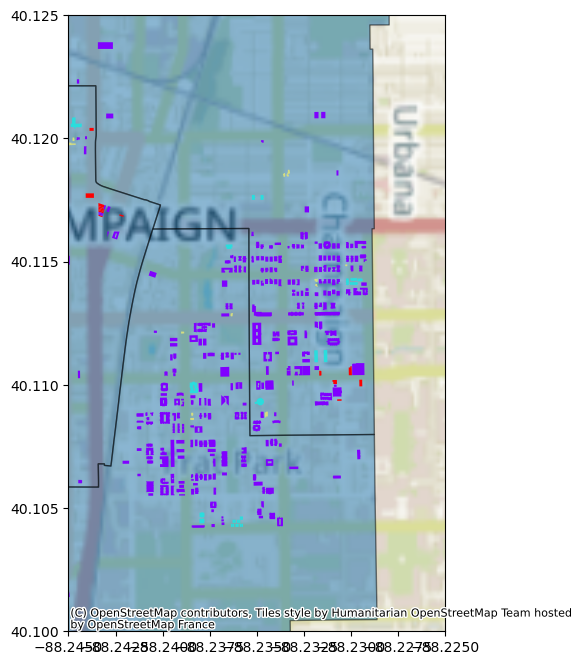

In [173]:
fig, ax = plt.subplots(1,1,figsize=(10,8))


gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
gdf_apts.plot(column='Building_Type', ax=ax, cmap='rainbow')

ctx.add_basemap(ax=ax, crs=gdf_councils.crs.to_string())

ax.set_xlim(-88.245, -88.225)
ax.set_ylim(40.10, 40.125)

plt.show()

Huh, that's a little fuzzy.  What about if we set our axis zoom region before we ping `contextily` to give us a map?

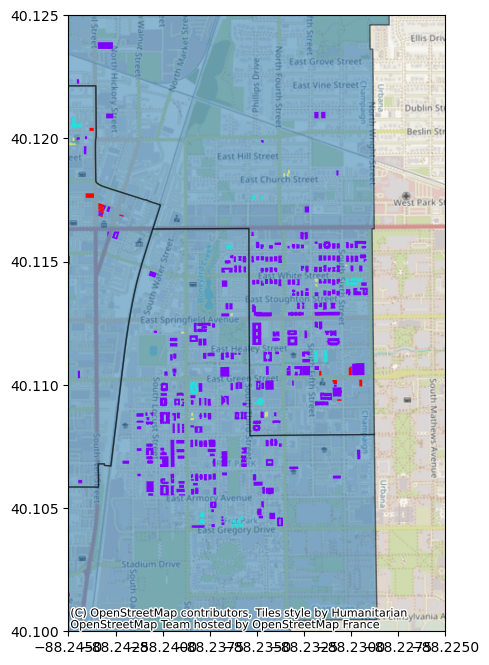

In [174]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

ax.set_xlim(-88.245, -88.225)
ax.set_ylim(40.10, 40.125)

gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
gdf_apts.plot(column='Building_Type', ax=ax, cmap='rainbow')

ctx.add_basemap(ax=ax, crs=gdf_councils.crs.to_string())

plt.show()

Lovely! Finally, let's add a legend:

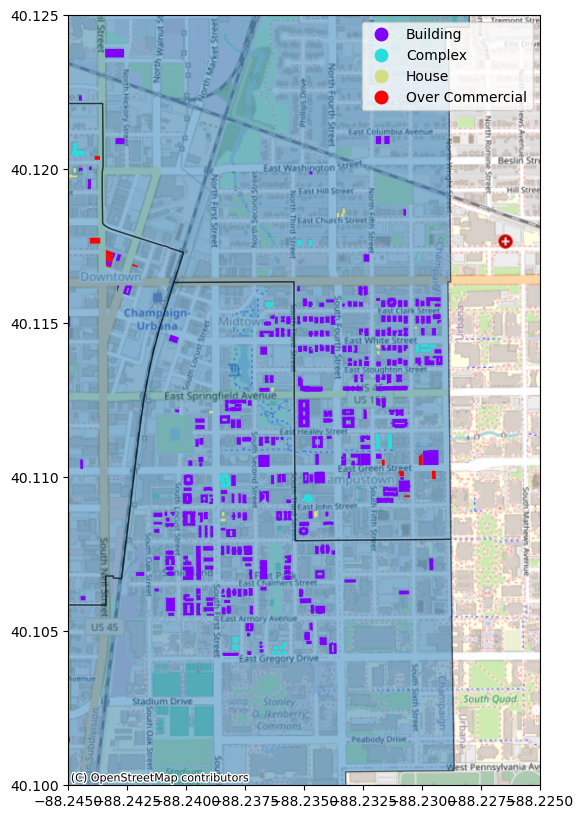

In [175]:
fig, ax = plt.subplots(1,1,figsize=(10,10))

ax.set_xlim(-88.245, -88.225)
ax.set_ylim(40.10, 40.125)

gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
gdf_apts.plot(column='Building_Type', ax=ax, cmap='rainbow', categorical=True, legend=True)

#ctx.add_basemap(ax=ax, crs=gdf_councils.crs.to_string()) # if this gives an error then:
#https://github.com/geopandas/contextily/issues/223
ctx.add_basemap(ax=ax, crs=gdf_councils.crs, source=ctx.providers.OpenStreetMap.Mapnik)


plt.show()

What if I want to only plot one building type?  What about interactively?

## 4. Geopandas + contextily + ipywidgets

In [176]:
import ipywidgets

We'll follow our usual way of using ".interact" to make a "default" kind of widget.

1. We'll start by making our plot with our parameter of choice "hard coded":

In [177]:
btype = 'Building'

gdf_apts.loc[gdf_apts['Building_Type']==btype].head() # our subsetted dataframe

,OBJECTID,Address,Parcel,Units,Stories,UniqueID,Building_Name,Complex_Name,Case_Number,Building_Type,...,Last_Date,Comments,Safety_Comments,Fire_Alarms,Sprinkler,Managing_Company,MFRecyclingStatus,Shape.STArea(),Shape.STLength(),geometry
20,21,410 E Green St,462118129026 & 462118129027,64,5,20.0,410 E Green St,,None,Building,...,NaN,None,None,None,None,None,Yes,15958.883007,507.147218,"POLYGON ((-88.23259 40.11039, -88.23218 40.110..."
21,22,408 E Green St,462118129017,28,3,21.0,408 E Green St,,AI08-0013,Building,...,1.225865e+12,,,None,None,None,Yes,8914.532782,539.800411,"POLYGON ((-88.23259 40.11039, -88.2326 40.1107..."
22,23,406 E Green St,462118129017,9,2,22.0,406 E Green St,,AI08-0013,Building,...,1.225865e+12,,,None,None,None,Yes,2434.252065,215.323497,"POLYGON ((-88.23284 40.11054, -88.23297 40.110..."
96,97,1114 Broadmoor Dr,452023257004,4,1,112.0,1114 Broadmoor Dr,,AI09-0018,Building,...,1.262585e+12,,,None,None,None,None,2008.372170,187.683177,"POLYGON ((-88.26361 40.09367, -88.26373 40.093..."
97,98,1201 Broadmoor Dr,452023256021,2,1,113.0,1201 Broadmoor Dr,Broadmoor Drive Apartments,None,Building,...,NaN,None,None,None,None,None,None,3677.721026,413.708046,"POLYGON ((-88.26447 40.0937, -88.26447 40.0938..."


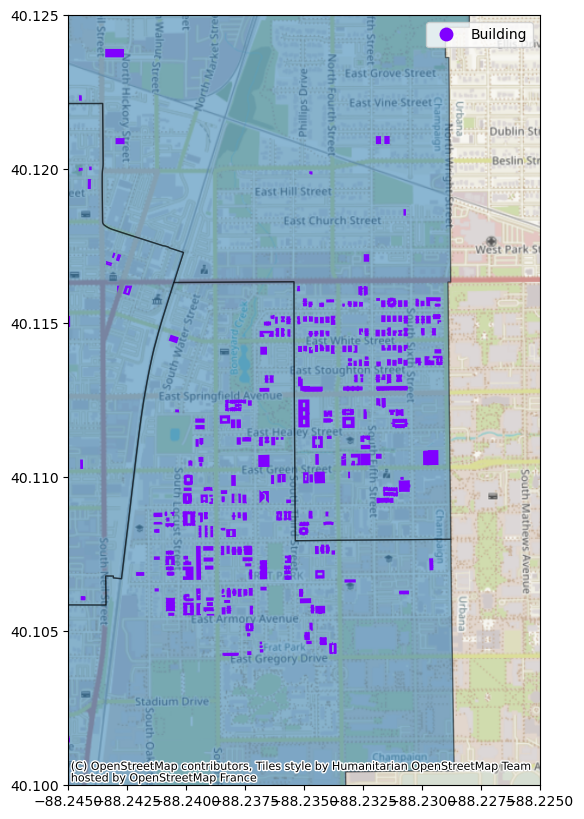

In [178]:
btype = 'Building'

gdf_apts_subset = gdf_apts.loc[gdf_apts['Building_Type']==btype] # our subsetted dataframe


fig, ax = plt.subplots(1,1,figsize=(10,10))

ax.set_xlim(-88.245, -88.225)
ax.set_ylim(40.10, 40.125)

gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
gdf_apts_subset.plot(column='Building_Type', ax=ax, cmap='rainbow', categorical=True, legend=True) # look what changes

ctx.add_basemap(ax=ax, crs=gdf_councils.crs.to_string())

plt.show()

2. We make this into a function an have our "hard coded" parameter as an input:

In [179]:
#btype = 'Building'

def my_geopandas_plot(btype):
    gdf_apts_subset = gdf_apts.loc[gdf_apts['Building_Type']==btype] # our subsetted dataframe

    fig, ax = plt.subplots(1,1,figsize=(10,10))

    ax.set_xlim(-88.245, -88.225)
    ax.set_ylim(40.10, 40.125)

    gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
    gdf_apts_subset.plot(column='Building_Type', ax=ax, cmap='rainbow', categorical=True, legend=True) # look what changes

    ctx.add_basemap(ax=ax, crs=gdf_councils.crs.to_string())

    plt.show()

4. We try out our function a few times:

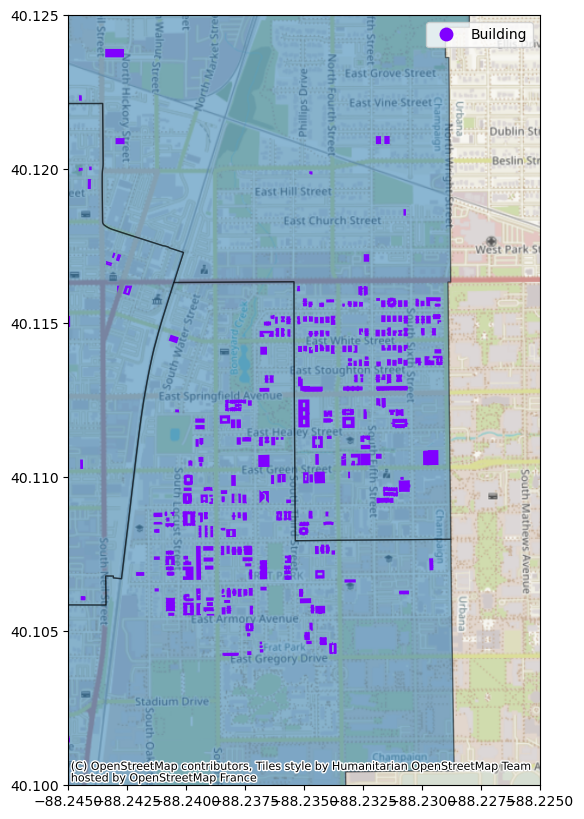

In [180]:
my_geopandas_plot('Building')

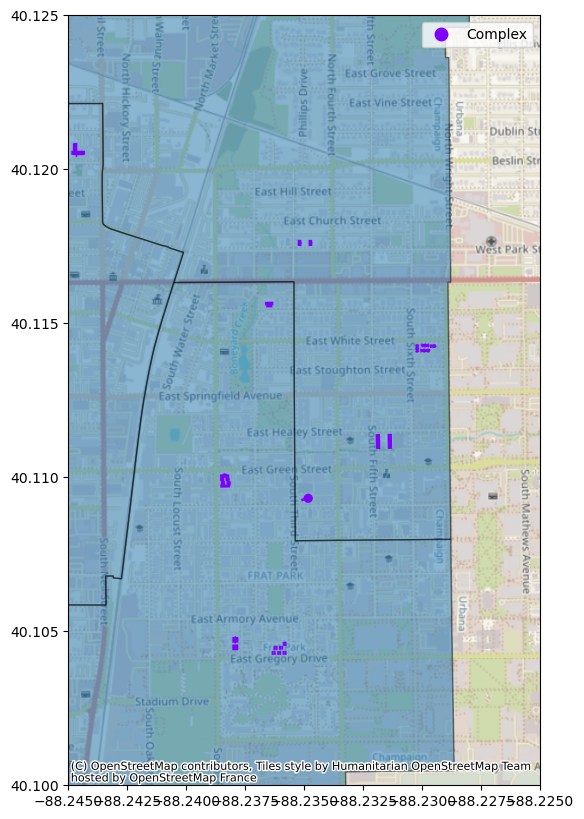

In [181]:
my_geopandas_plot('Complex')

5. Finally, we use `@ipywidgets.interact` to make this interactive:

In [182]:
@ipywidgets.interact(btype=gdf_apts['Building_Type'].unique())
def my_geopandas_plot(btype):
    gdf_apts_subset = gdf_apts.loc[gdf_apts['Building_Type']==btype] # our subsetted dataframe

    fig, ax = plt.subplots(1,1,figsize=(10,10))

    ax.set_xlim(-88.245, -88.225)
    ax.set_ylim(40.10, 40.125)

    gdf_councils.plot(ax=ax, alpha=0.5, edgecolor='k')
    gdf_apts_subset.plot(column='Building_Type', ax=ax, cmap='rainbow', categorical=True, legend=True) # look what changes

    ctx.add_basemap(ax=ax, crs=gdf_councils.crs.to_string())

    plt.show()

interactive(children=(Dropdown(description='btype', options=('Complex', 'Building', 'House', 'Over Commercial'…

## Extra: Plot waterways

One more!

In [185]:
gdf_water = geopandas.read_file('https://www2.census.gov/geo/tiger/TIGER2025/AREAWATER/tl_2025_01001_areawater.zip')

In [186]:
gdf_water.head()

,ANSICODE,HYDROID,FULLNAME,MTFCC,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,None,110585123246,None,H2030,0,1058,+32.4475829,-86.7287169,"POLYGON ((-86.72889 32.44744, -86.72886 32.447..."
1,None,110585122713,Motley Pond,H2030,0,19810,+32.4854734,-86.6282779,"POLYGON ((-86.62903 32.48538, -86.6289 32.4856..."
2,None,110585122709,Swift Crk,H2030,0,1185120,+32.4107383,-86.6320375,"POLYGON ((-86.64343 32.43036, -86.64342 32.430..."
3,None,110585122725,Alabama Riv,H3010,0,1361299,+32.3952613,-86.8385000,"POLYGON ((-86.8578 32.43968, -86.85768 32.4395..."
4,None,110585122766,White Water Lk,H2030,0,232895,+32.4690021,-86.6388877,"POLYGON ((-86.6417 32.46588, -86.64136 32.4663..."


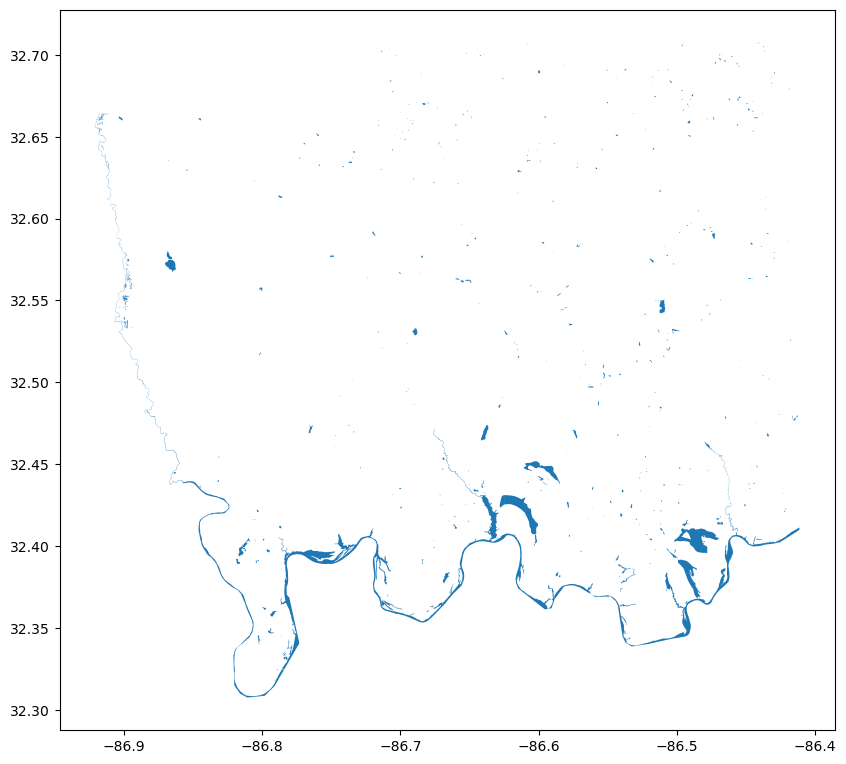

In [187]:
fig, ax = plt.subplots(figsize=(10,10))
gdf_water.plot(ax=ax)
plt.show()
# we can see this is showing data for a small subset of the US

Where are these waterways?

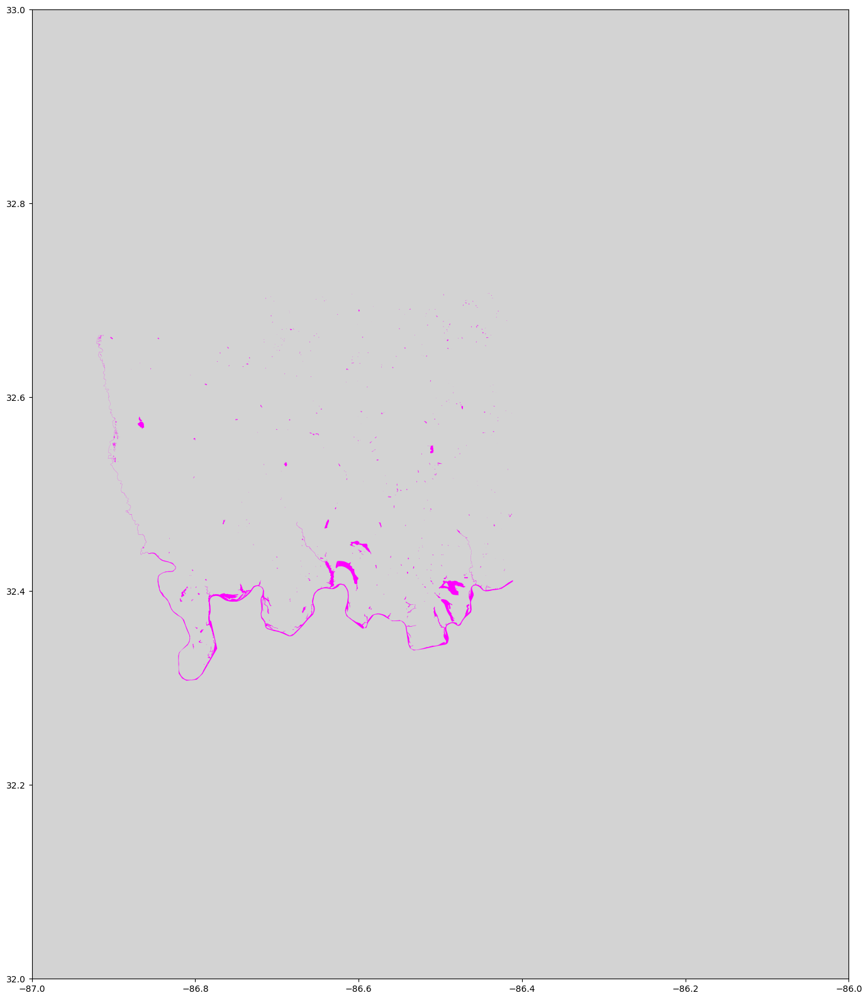

In [188]:
fig, ax = plt.subplots(figsize=(20,20))
gdf_states.plot(ax=ax, color='lightgray')
gdf_water.plot(ax=ax, color='magenta')

ax.set_xlim(-87, -86)
ax.set_ylim(32,33)

plt.show()

Let's zoom out a good deal:

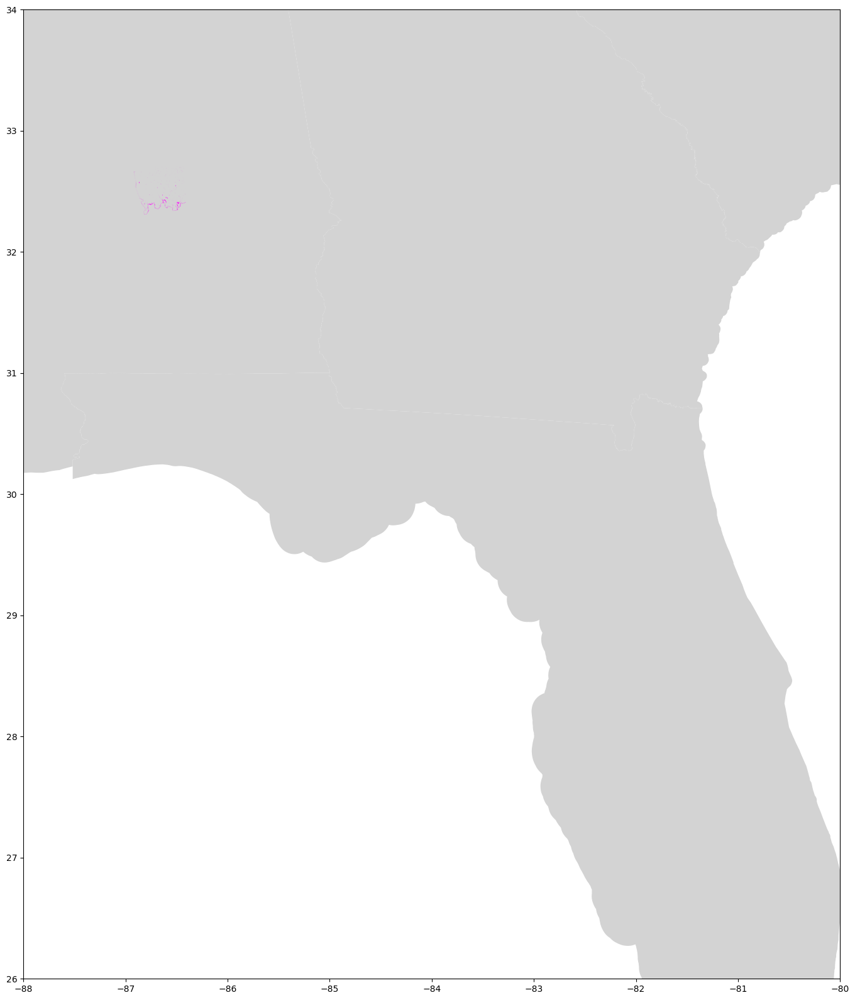

In [189]:
fig, ax = plt.subplots(figsize=(20,20))
gdf_states.plot(ax=ax, color='lightgray')
gdf_water.plot(ax=ax, color='magenta')

ax.set_xlim(-88, -80)
ax.set_ylim(26, 34)

plt.show()

## Extra: Using GeoJSON data in bqplot

We can use `requests` to ping websites for GeoJSON files directly.

In [190]:
import requests

In [191]:
shape_file_url = 'https://opendata.arcgis.com/datasets/1f75636917604299861fb408bbf79378_1.geojson'
gdata = requests.get(shape_file_url).json()

In [192]:
gdata

{'type': 'FeatureCollection',
 'name': 'City_Council_Districts',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'OBJECTID_1': 811,
    'District': '5',
    'Council_me': 'Vanna Pianfetti',
    'ShapeSTArea': 184331097.4668916,
    'ShapeSTLength': 209994.93561601941},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-88.31441072927392, 40.11698590433241],
      [-88.31453605261626, 40.11698635523784],
      [-88.31455540134952, 40.116986425022624],
      [-88.31473228495142, 40.116987061486576],
      [-88.31539756632594, 40.11698945220445],
      [-88.31620711161898, 40.11699235676648],
      [-88.31689954984104, 40.11699483563354],
      [-88.31689826989421, 40.116912488666884],
      [-88.31923827309942, 40.11691392195105],
      [-88.31921198210522, 40.11458861069375],
      [-88.31921167223642, 40.11456115781356],
      [-88.31821067635474, 40.11455754692689],
      [-88.3181534204886

Let's use our champaign county map in bqplot maps.  First, let's zoom into IL:

In [193]:
sc_geo = bqplot.Mercator(scale_factor = 10000, center=(-88.2434, 40.15)) # long/lat, scale factor is default of 190

state_data = bqplot.topo_load('map_data/USStatesMap.json')

def_tt = bqplot.Tooltip(fields=['id', 'name'])

states_map = bqplot.Map(map_data=state_data, scales={'projection':sc_geo}, tooltip=def_tt)
states_map.interactions = {'click': 'select', 'hover': 'tooltip'}

fig=bqplot.Figure(marks=[states_map], title='US States Map Example',
                  fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0})
fig

Figure(fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0}, marks=[Map(hovered_styles={'hovered_fill': '…

We can use this scale to plot the Champaign county map:

In [194]:
sc_geo = bqplot.Mercator(scale_factor = 10000, center=(-88.2434, 40.15)) # long/lat, scale factor is default of 190

mymap = bqplot.Map(map_data=gdata, scales={'projection':sc_geo})

fig=bqplot.Figure(marks=[mymap], title='Map Example',
                  fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0})
fig

Figure(fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0}, marks=[Map(hovered_styles={'hovered_fill': '…

That's still pretty far out, let's zoom in!

In [195]:
sc_geo = bqplot.Mercator(scale_factor = 200000, center=(-88.2434, 40.15)) # long/lat, scale factor is default of 190

mymap = bqplot.Map(map_data=gdata, scales={'projection':sc_geo})

fig=bqplot.Figure(marks=[mymap], title='Map Example',
                  fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0})
fig

Figure(fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0}, marks=[Map(hovered_styles={'hovered_fill': '…

In [196]:
sc_geo = bqplot.Mercator(scale_factor = 200000, center=(-88.2434, 40.15)) # long/lat, scale factor is default of 190

def_tt = bqplot.Tooltip(fields=['District', 'Council_me'])

mymap = bqplot.Map(map_data=gdata, scales={'projection':sc_geo}, tooltip=def_tt)

mymap.colors = {'default_color':"blue"}

mymap.interactions = {'click': 'select', 'hover': 'tooltip'}

fig=bqplot.Figure(marks=[mymap], title='Map Example',
                  fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0})
fig

Figure(fig_margin={'top': 0, 'bottom': 0, 'left': 0, 'right': 0}, marks=[Map(colors={'default_color': 'blue'},…

Note: its hard to get two layers on a `bqplot` map however (though this might change in the future).  For multi-layer plots that are interactive, it might be more useful to try a combination of `ipywidgets` and `geopandas`.

### ASIDE

How do I find out what is supported in my tooltip?

In [197]:
state_data.keys()

dict_keys(['type', 'objects', 'transform', 'arcs'])

In [198]:
state_data['objects'].keys()

dict_keys(['land', 'subunits'])

In [199]:
state_data['objects']['land']

{'type': 'MultiPolygon',
 'properties': {'counties': None},
 'arcs': [[[5830,
    6026,
    6034,
    6073,
    6164,
    6179,
    6023,
    6043,
    6231,
    6416,
    6410,
    6564,
    6243,
    6565,
    6546,
    6475,
    6542,
    6784,
    6741,
    6811,
    6739,
    6870,
    6965,
    7087,
    7246,
    -7086,
    7247,
    7255,
    7256,
    7257,
    7305,
    7566,
    9399,
    7668,
    9397,
    -7836,
    9398,
    7838,
    8050,
    8017,
    8018,
    8019,
    8020,
    8021,
    8047,
    8023,
    8252,
    8247,
    8302,
    8493,
    8575,
    -8491,
    8576,
    8671,
    8807,
    8877,
    8984,
    9074,
    9116,
    9138,
    9129,
    9073,
    8960,
    8874,
    8961,
    8956,
    8957,
    9090,
    9130,
    9181,
    -9123,
    9182,
    9125,
    9177,
    9255,
    9278,
    9279,
    9280,
    9311,
    9306,
    9307,
    9308,
    9309,
    9318,
    9340,
    9347,
    9342,
    9343,
    9344,
    9345,
    9349,
    9338,
    9326

In [200]:
state_data['objects']['land'].keys()

dict_keys(['type', 'properties', 'arcs'])

In [201]:
state_data['objects']['subunits'].keys()

dict_keys(['type', 'geometries'])

In [202]:
len(state_data['objects']['subunits']['geometries'])

53

In [203]:
state_data['objects']['subunits']['geometries'][0].keys()

dict_keys(['arcs', 'type', 'id', 'properties'])

In [204]:
# the two we are interested in:
print(state_data['objects']['subunits']['geometries'][0]['id'])
print(state_data['objects']['subunits']['geometries'][0]['properties'])

53
{'name': 'Washington'}


What would be available for my council dataset?

In [205]:
gdata['features'][0]['properties'] # these are possible keys for our tooltip

{'OBJECTID_1': 811,
 'District': '5',
 'Council_me': 'Vanna Pianfetti',
 'ShapeSTArea': 184331097.4668916,
 'ShapeSTLength': 209994.93561601941}

### END ASIDE

## Extra: Super quick - ipyleaflet

In [206]:
#!pip install ipyleaflet
from ipyleaflet import *
# note: you might have to close and reopen you notebook
# to see the map

m = Map(center=(52, 10), zoom=8, basemap=basemaps.Gaode.Satellite)

m

Map(center=[52, 10], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_tex…

In [207]:
#!pip install ipyleaflet
from ipyleaflet import *
# note: you might have to close and reopen you notebook
# to see the map

m = Map(center=(52, 10), zoom=8, basemap=basemaps.Gaode.Satellite)

#(2) street maps
strata_all = basemap_to_tiles(basemaps.Strava.All)
m.add_layer(strata_all)
m

Map(center=[52, 10], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_tex…